# Imports 🏗

In [128]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, learning_curve
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, Ridge, ElasticNet, SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor, RandomForestRegressor, StackingRegressor, VotingRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
import folium

In [129]:
listings_df = pd.read_csv('Airbnb Data/Listings.csv', encoding = "ISO-8859-1")

/Users/sachalehmann/.pyenv/versions/3.8.12/envs/lewagon_current/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (5,13) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [130]:
listings_df.shape

(279712, 33)

In [131]:
listings_df.head()

,listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,...,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
0,281420,"Beautiful Flat in le Village Montmartre, Paris",1466919,2011-12-03,"Paris, Ile-de-France, France",NaN,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
1,3705183,39 mÃÂ² Paris (Sacre CÃ âur),10328771,2013-11-29,"Paris, Ile-de-France, France",NaN,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
2,4082273,"Lovely apartment with Terrace, 60m2",19252768,2014-07-31,"Paris, Ile-de-France, France",NaN,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
3,4797344,Cosy studio (close to Eiffel tower),10668311,2013-12-17,"Paris, Ile-de-France, France",NaN,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
4,4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,24837558,2014-12-14,"Paris, Ile-de-France, France",NaN,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f


# Data cleaning and exploration 🔎

## Removal of duplicates 👬

Let's first remove the *listing_id* column to see whether we have duplicates (this feature is similar to the index and each listing, whether it is a duplicate or not, has a unique listing_id)

In [132]:
listings_df = listings_df.drop(columns = ['listing_id'])

In [133]:
len(listings_df)-len(listings_df.drop_duplicates())

27

In [134]:
listings_df = listings_df.drop_duplicates()

## Geographical visualisation using folium (to visualise the maps click here: http://nbviewer.org/github/DerSach/airbnb-pricing/blob/main/airbnb_v5.ipynb) 🗺️

In [12]:
city_centers = {
    'Paris' : [48.852968, 2.349902],
    'New York' : [40.6643, -73.9385],
    'Bangkok' : [13.736717,100.523186],
    'Rio de Janeiro' : [-22.9201,-43.3307],
    'Sydney' : [-33.865143,151.209900],
    'Istanbul' : [41.00527,28.97696],
    'Rome' : [41.873988,12.564167],
    'Hong Kong' : [22.302711,114.177216],
    'Mexico City' : [19.432608,	-99.133209],
    'Cape Town' : [-33.918861,18.423300]
}

In [27]:
''' Let's plot a map with a sample of 1,000 listings for each city of the dataset '''
for city in listings_df['city'].unique():
  city_df = listings_df[listings_df['city'] == city]
  city_df = city_df.sample(n=1000) # to sample 1,000 rows of the city_df

  q1 = np.quantile(city_df['price'].values, .25)
  q2 = np.quantile(city_df['price'].values, .50)
  q3 = np.quantile(city_df['price'].values, .75) # we etract the 1st, 2nd and 3rd quartiles of the sample prices to create color buckets on the map

  m=folium.Map(location=city_centers[city], zoom_start = 12) # we create the map

  for i in range(len(city_df[:1000])):
    if city_df['price'].iloc[i] > q3: # if listing's price in the last quartile, print a darkred circle
      folium.vector_layers.Circle(location=[city_df['latitude'].iloc[i], city_df['longitude'].iloc[i]], 
                                  radius=10, 
                                  popup=str(city_df['name'].iloc[i]), 
                                  opacity = 1,
                                  color = 'darkred').add_to(m)
    elif city_df['price'].iloc[i] > q2: # if listing's price in the third quartile, print a red circle
      folium.vector_layers.Circle(location=[city_df['latitude'].iloc[i], city_df['longitude'].iloc[i]], 
                                  radius=10, 
                                  popup=str(city_df['name'].iloc[i]), 
                                  opacity = 1,
                                  color = 'red').add_to(m)
    elif city_df['price'].iloc[i] > q1: # if listing's price in the second quartile, print an orange circle
      folium.vector_layers.Circle(location=[city_df['latitude'].iloc[i], city_df['longitude'].iloc[i]], 
                                  radius=10, 
                                  popup=str(city_df['name'].iloc[i]), 
                                  opacity = 1,
                                  color = 'orange').add_to(m)
    else: # otherwise print a yellow circle
      folium.vector_layers.Circle(location=[city_df['latitude'].iloc[i], city_df['longitude'].iloc[i]], 
                                  radius=10, 
                                  popup=str(city_df['name'].iloc[i]), 
                                  opacity = 1,
                                  color = 'yellow').add_to(m)
  print('\033[1m' + '------------------------------------------------------' + city.upper() + '------------------------------------------------------')
  display(m)
  print()

------------------------------------------------------PARIS------------------------------------------------------



------------------------------------------------------NEW YORK------------------------------------------------------



------------------------------------------------------BANGKOK------------------------------------------------------



------------------------------------------------------RIO DE JANEIRO------------------------------------------------------



------------------------------------------------------SYDNEY------------------------------------------------------



------------------------------------------------------ISTANBUL------------------------------------------------------



------------------------------------------------------ROME------------------------------------------------------



------------------------------------------------------HONG KONG------------------------------------------------------



------------------------------------------------------MEXICO CITY------------------------------------------------------



------------------------------------------------------CAPE TOWN------------------------------------------------------


## Removal of irrelevant columns

In [135]:
listings_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 279685 entries, 0 to 279711
Data columns (total 32 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   name                         279512 non-null  object 
 1   host_id                      279685 non-null  int64  
 2   host_since                   279520 non-null  object 
 3   host_location                278845 non-null  object 
 4   host_response_time           150914 non-null  object 
 5   host_response_rate           150914 non-null  float64
 6   host_acceptance_rate         166609 non-null  float64
 7   host_is_superhost            279520 non-null  object 
 8   host_total_listings_count    279520 non-null  float64
 9   host_has_profile_pic         279520 non-null  object 
 10  host_identity_verified       279520 non-null  object 
 11  neighbourhood                279685 non-null  object 
 12  district                     37006 non-null   object 
 13 

In [136]:
print(listings_df['host_response_time'].isna().sum()/len(listings_df))
print(listings_df['host_response_rate'].isna().sum()/len(listings_df))
print(listings_df['host_acceptance_rate'].isna().sum()/len(listings_df))

0.4604143947655398
0.4604143947655398
0.40429769204640936


In [137]:
listings_df['property_type'].value_counts()

Entire apartment                138988
Private room in apartment        47322
Private room in house            13292
Entire house                     13273
Entire condominium               11250
                                 ...  
Shared room in floor                 1
Shared room in parking space         1
Shared room in tent                  1
Train                                1
Tipi                                 1
Name: property_type, Length: 144, dtype: int64

In [138]:
listings_df['room_type'].value_counts()

Entire place    181998
Private room     86972
Hotel room        5853
Shared room       4862
Name: room_type, dtype: int64

In [139]:
listings_df['accommodates'].value_counts()

2     118315
4      57259
3      27929
1      25812
6      19455
5      13526
8       6514
7       3697
10      2630
16      1162
9       1140
12      1052
11       367
14       331
15       214
13       197
0         85
Name: accommodates, dtype: int64

**Reasons for removing the following columns**
- *listing_id*: similar to index,
- *name*: we could perform a regex analysis (e.g. contains the word 'cosy', 'calm', etc.) but could be very time-consuming. Besides, it is uncertain to know how to treat those c.300k names, what word to prefer, etc.
- *host_id*: we could engineer from it the total number of listings a host has, but this information is already present in the *host_total_listings_count* column
- *host_response_time*, *host_response_rate*, *host_acceptance_rate*, *district*: over 40% of missing values - for the three first features, this is probably due to the fact that it is the first listing of those hosts. No clear imputation to replace those values. Let's keep it aside 
- *neighbourhood*, *property_type*: too high cardinality
- *latitude*, *longitude*: rather useful for data viz with folium
- *review_scores_rating*, *review_scores_accuracy*, *review_scores_cleanliness*, *review_scores_checking*, *review_scores_communication*, *review_scores_location*, *review_scores_value*: data leakage (i.e review_scores columns can derive from the price; for instance a bad review could be a consequence from a high price)

Additional remarks: there could also be some data leakage for some other features. For instance, it is not clear how the *host_is_superhost* feature is built. Is she superhost at the time of posting the listing for the first time or does it come after to that? In the latter case, there would be data leakage. Same kind of issue arises for *host_total_listings_count*. We will here assume there is no data leakage for those columns.

In [140]:
listings_df = listings_df.drop(columns = ['name','host_id','host_response_time','host_response_rate','host_acceptance_rate','neighbourhood','district','latitude','longitude','property_type','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value'])

In [141]:
listings_df['host_since'] = pd.to_datetime(listings_df['host_since'])

In [142]:
listings_df[listings_df['host_is_superhost'].isna()]

,host_since,host_location,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,city,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,instant_bookable
52879,NaT,NaN,NaN,NaN,NaN,NaN,Paris,Entire place,2,1.0,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long...",57,1,1125,f
52880,NaT,NaN,NaN,NaN,NaN,NaN,Paris,Entire place,2,1.0,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long...",58,1,1125,f
52881,NaT,NaN,NaN,NaN,NaN,NaN,Paris,Entire place,4,2.0,"[""Shampoo"", ""Heating"", ""TV"", ""Indoor fireplace...",90,3,1125,f
52882,NaT,NaN,NaN,NaN,NaN,NaN,Paris,Entire place,5,1.0,"[""Pocket wifi"", ""Dishwasher"", ""Essentials"", ""A...",89,4,1125,t
52883,NaT,NaN,NaN,NaN,NaN,NaN,Paris,Entire place,2,NaN,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Sm...",119,3,1125,f
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229887,NaT,NaN,NaN,NaN,NaN,NaN,Rome,Entire place,3,1.0,"[""Dishwasher"", ""Oven"", ""Dishes and silverware""...",85,2,30,f
229888,NaT,NaN,NaN,NaN,NaN,NaN,Rome,Entire place,4,2.0,"[""Washer"", ""Microwave"", ""Hangers"", ""Iron"", ""Re...",37,2,29,t
229889,NaT,NaN,NaN,NaN,NaN,NaN,Rome,Entire place,4,1.0,"[""Hangers"", ""Iron"", ""Refrigerator"", ""Dishes an...",33,2,29,t
229890,NaT,NaN,NaN,NaN,NaN,NaN,Rome,Entire place,6,2.0,"[""Microwave"", ""Iron"", ""Refrigerator"", ""Dishes ...",43,2,29,f


We notice that *host_since, host_is_superhost, host_total_listings_count, host_has_profile_pic, host_identity_verified* columns share the same few missing values. We can remove this small number of lines then (165 out of c.300k).

In [143]:
na_index_list = listings_df[listings_df['host_is_superhost'].isna()].index

listings_df.drop(na_index_list, inplace = True)

listings_df.shape

(279520, 15)

**Analysis of the target** 🎯

We know that the price is given in the listing country's currency. Hence let's have a look at where those listing's are.

In [144]:
listings_df['city'].value_counts()

Paris             64652
New York          36988
Sydney            33596
Rome              27631
Rio de Janeiro    26591
Istanbul          24496
Mexico City       20054
Bangkok           19360
Cape Town         19069
Hong Kong          7083
Name: city, dtype: int64

Only 10 cities are represented in this dataset. We will then convert all the listings prices to Euro to have the same target unit. For that we will take the average EUR exchange rate over the last ten years.

In [145]:
exchange_rate_dic = {
    'EUREUR' : 1.0,
    'USDEUR' : 0.843132,
    'AUDEUR' : 0.673667,
    'BRLEUR' : 0.250401,
    'TRYEUR' : 0.261538,
    'MXNEUR' : 0.052127,
    'THBEUR' : 0.026046,
    'ZAREUR' : 0.067925,
    'HKDEUR' : 0.108398
}

city_exch_rate_dic = {
    'Paris' : 'EUREUR',             
    'New York' : 'USDEUR',          
    'Sydney' : 'AUDEUR',            
    'Rome' : 'EUREUR',              
    'Rio de Janeiro' : 'BRLEUR',    
    'Istanbul' : 'TRYEUR',          
    'Mexico City' : 'MXNEUR',       
    'Bangkok' : 'THBEUR',           
    'Cape Town' : 'ZAREUR',         
    'Hong Kong' : 'HKDEUR'
}

In [146]:
listings_df['exch_rate'] = listings_df['city'].map(city_exch_rate_dic)
listings_df['exch_rate_value'] = listings_df['exch_rate'].map(exchange_rate_dic)
listings_df['price_eur'] = listings_df['price'] * listings_df['exch_rate_value']

**Average price per listing for each city**

In [147]:
avg_price_per_city_df = listings_df.groupby('city', as_index=False)['price_eur'].mean()

In [148]:
avg_price_per_city_df.sort_values(by = 'price_eur', inplace = True)
avg_price_per_city_df.rename(columns = {'price_eur' : 'avg_price_eur'}, inplace = True)
avg_price_per_city_df

,city,avg_price_eur
0,Bangkok,54.129859
4,Mexico City,59.911141
2,Hong Kong,80.875743
8,Rome,105.112301
6,Paris,113.090160
5,New York,120.438014
3,Istanbul,139.343327
9,Sydney,149.607813
1,Cape Town,163.421555
7,Rio de Janeiro,185.943549


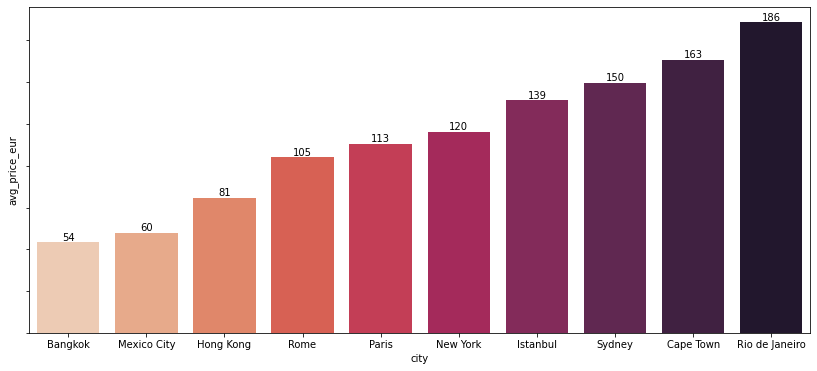

In [149]:
fig = plt.figure(figsize = (14, 6))
g = sns.barplot(x = 'city', y = 'avg_price_eur', data = avg_price_per_city_df, palette= sns.color_palette("rocket_r",n_colors = 10))

for p in g.patches:
    g.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')
g.set(yticklabels=[]);

If we further analyze the target we notice strong outliers as well as null values. We remove the null values as they are errors (having no further info on the dataset - maybe are they discounts?)

In [150]:
listings_df = listings_df[listings_df['price'] != 0]

In [151]:
len(listings_df[listings_df['price_eur'] > 1000])/len(listings_df)

0.00805634790824854

We notice that less than 1% of the dataset has very high prices in euros. Those outliers will greatly harm the performance of our model. We thus choose to remove them, focusing on the 'regular' 99%.

In [152]:
listings_df = listings_df[listings_df['price_eur'] < 1000]

**Engineering on the target**

Let's compute the log of the target. Using log usually gives better results with ML regression models, especially when (as it is the case here) you have some outliers

In [153]:
listings_df['log_price_eur'] = np.log(listings_df['price_eur'])

In [154]:
listings_df = listings_df.drop(columns = ['price','exch_rate','exch_rate_value','price_eur'])

**Dividing our dataset in train/test sets**

In [155]:
X = listings_df.drop(columns = 'log_price_eur')
y = listings_df['log_price_eur']

In [156]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

We create a copy for a later use in our Pipeline

In [157]:
X_train_copy = X_train.copy()

In [158]:
for i,j in enumerate([X_train, 
                      y_train, 
                      X_test, 
                      y_test]):
          print(f'shape of {i} is {j.shape}')

shape of 0 is (193958, 14)
shape of 1 is (193958,)
shape of 2 is (83125, 14)
shape of 3 is (83125,)


## Analysis of missing values ❓

In [159]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 193958 entries, 109840 to 113593
Data columns (total 14 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   host_since                 193958 non-null  datetime64[ns]
 1   host_location              193513 non-null  object        
 2   host_is_superhost          193958 non-null  object        
 3   host_total_listings_count  193958 non-null  float64       
 4   host_has_profile_pic       193958 non-null  object        
 5   host_identity_verified     193958 non-null  object        
 6   city                       193958 non-null  object        
 7   room_type                  193958 non-null  object        
 8   accommodates               193958 non-null  int64         
 9   bedrooms                   173474 non-null  float64       
 10  amenities                  193958 non-null  object        
 11  minimum_nights             193958 non-null  int

Let's look at the cardinality and the details for low-cardinality columns, trying to get a better understanding of the data we manipulate, and to see if there are missing values not classified so by pandas

In [160]:
for col in X_train.columns:
    print(col)
    print(X_train[col].nunique())
    if X_train[col].nunique()<11:
        print(X_train[col].value_counts())
    print()

host_since
4192

host_location
5863

host_is_superhost
2
f    158757
t     35201
Name: host_is_superhost, dtype: int64

host_total_listings_count
199

host_has_profile_pic
2
t    193352
f       606
Name: host_has_profile_pic, dtype: int64

host_identity_verified
2
t    139458
f     54500
Name: host_identity_verified, dtype: int64

city
10
Paris             45177
New York          25671
Sydney            23333
Rome              19183
Rio de Janeiro    18204
Istanbul          16967
Mexico City       14004
Bangkok           13592
Cape Town         12975
Hong Kong          4852
Name: city, dtype: int64

room_type
4
Entire place    126086
Private room     60535
Hotel room        3995
Shared room       3342
Name: room_type, dtype: int64

accommodates
16

bedrooms
37

amenities
173523

minimum_nights
171

maximum_nights
448

instant_bookable
2
f    113667
t     80291
Name: instant_bookable, dtype: int64



The *bedroom* feature has around 10% of missing values. Let's fill those values with this feature median value.

In [161]:
X_train['bedrooms'].isna().sum()/len(X_train)

0.10561049299332845

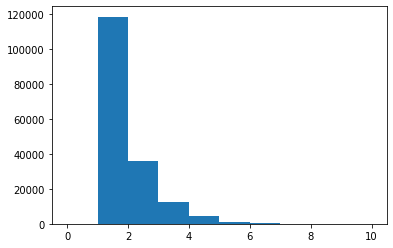

In [162]:
plt.hist(X_train['bedrooms'], range = (0,10));

In [163]:
X_train['bedrooms'].median()

1.0

In [164]:
bedrooms_imputer = SimpleImputer(strategy = 'median')

X_train['bedrooms'] = bedrooms_imputer.fit_transform(X_train[['bedrooms']])

/var/folders/d8/5t_vwtk92556hmfkq1xg8m0w0000gn/T/ipykernel_3587/2382464579.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['bedrooms'] = bedrooms_imputer.fit_transform(X_train[['bedrooms']])


In [165]:
pd.set_option('display.max_columns', 23)
X_train.head()

,host_since,host_location,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,city,room_type,accommodates,bedrooms,amenities,minimum_nights,maximum_nights,instant_bookable
109840,2014-01-23,"Paris, Ile-de-France, France",t,2.0,t,t,Paris,Private room,2,1.0,"[""First aid kit"", ""Heating"", ""TV"", ""Indoor fir...",3,1125,f
185327,2015-06-28,"New York, New York, United States",t,1.0,t,t,New York,Private room,1,1.0,"[""Refrigerator"", ""Free street parking"", ""Kitch...",30,60,f
30640,2019-10-29,"Mexico City, Mexico City, Mexico",t,1.0,t,t,Mexico City,Entire place,6,3.0,"[""Dedicated workspace"", ""Ceiling fan"", ""Dryer""...",2,1125,f
134779,2012-09-18,"Riverstone, New South Wales, Australia",f,0.0,t,f,Sydney,Private room,2,1.0,"[""Washer"", ""Iron"", ""Long term stays allowed"", ...",1,1125,t
256304,2016-07-05,FR,f,1.0,t,t,Paris,Entire place,4,1.0,"[""Iron"", ""Shampoo"", ""Heating"", ""Washer"", ""Dedi...",3,21,f


We look at the quality of the data in the column *host_location* with the aim of later comparing it to the listing city. Here we notice that around 20% of listings' location do not have a proper 'City, Province, Country' format. We can still use the column.

In [166]:
counter = 0
for i in X_train['host_location'].values:
    if ',' not in str(i):
        counter += 1
        
counter/len(X_train)

0.21061776260839976

## Scaling numerical features 📐

First let's have a look at the distribution of the numerical features and their outliers to determine our scaling strategy.

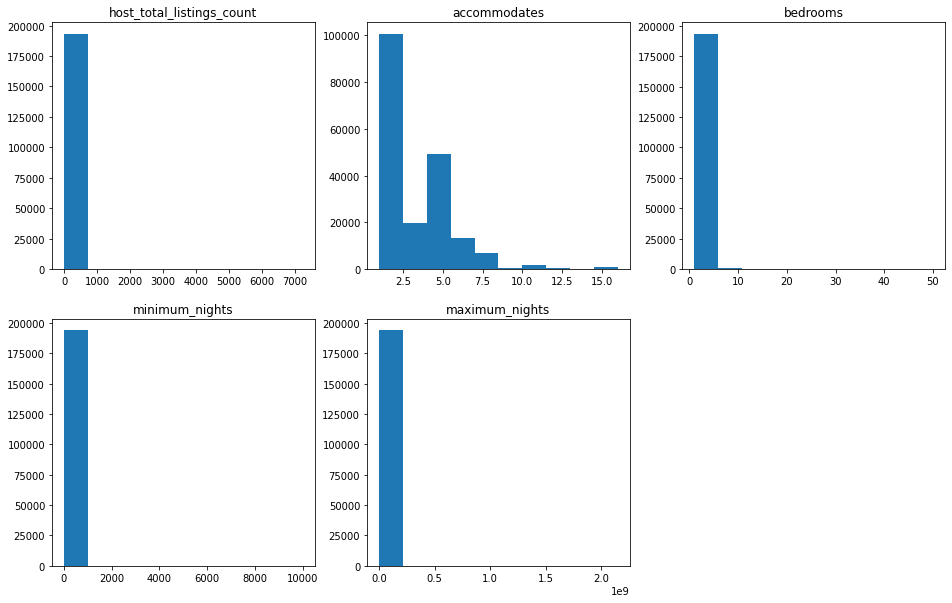

In [167]:
numerical_types = ['int64', 'float64']

counter = 0
fig = plt.figure(figsize = (16,10))
for col in X_train.columns:
    if X_train[col].dtype in numerical_types:
        counter += 1
        plt.subplot(2,3,counter)
        plt.hist(X_train[col])
        plt.title(col)

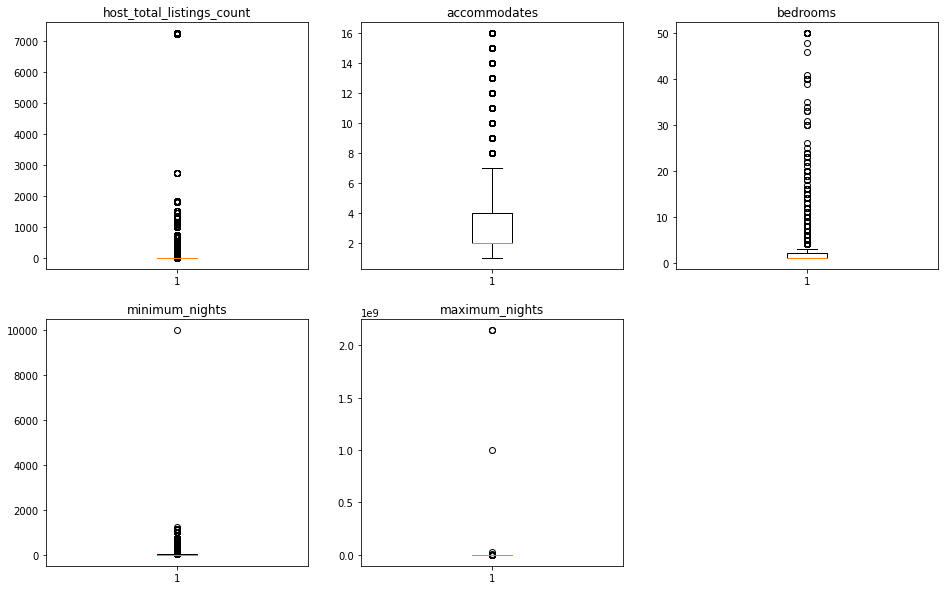

In [168]:
numerical_types = ['int64', 'float64']

counter = 0
fig = plt.figure(figsize = (16,10))
for col in X_train.columns:
    if X_train[col].dtype in numerical_types:
        counter += 1
        plt.subplot(2,3,counter)
        plt.boxplot(X_train[col])
        plt.title(col)

In [169]:
X_train.describe()

,host_total_listings_count,accommodates,bedrooms,minimum_nights,maximum_nights
count,193958.000000,193958.000000,193958.000000,193958.000000,1.939580e+05
mean,22.971736,3.256757,1.444514,8.055120,3.922343e+04
std,264.179013,2.073481,1.075069,33.964698,8.745706e+06
min,0.000000,1.000000,1.000000,1.000000,1.000000e+00
25%,1.000000,2.000000,1.000000,1.000000,4.500000e+01
50%,1.000000,2.000000,1.000000,2.000000,1.125000e+03
75%,4.000000,4.000000,2.000000,5.000000,1.125000e+03
max,7235.000000,16.000000,50.000000,9999.000000,2.147484e+09


Computation of shares of outliers

In [170]:
len(X_train[X_train['host_total_listings_count']>3])/len(X_train)

0.26842409181369165

In [171]:
len(X_train[X_train['bedrooms']>8])/len(X_train)

0.0013868981944544696

In [172]:
len(X_train[X_train['minimum_nights']>11])/len(X_train)

0.15377555965724538

In [173]:
len(X_train[X_train['maximum_nights']>2745])/len(X_train)

0.00022685323626764556

Less than 3% of listings are numerical features outliers. We can robust scale them

In [174]:
rob_scaler = RobustScaler()

In [175]:
numerical_features = X_train.describe().columns

X_train[numerical_features] = rob_scaler.fit_transform(X_train[numerical_features])

/Users/sachalehmann/.pyenv/versions/3.8.12/envs/lewagon_current/lib/python3.8/site-packages/pandas/core/frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[col] = igetitem(value, i)


# Features engineering 👷‍♂️

## Encoding categorical features

In [176]:
binary_features = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'instant_bookable']

In [177]:
def t_f_encoding(col):
    for x in col:
        if x == 't':
            return 1
        else:
            return 0

In [178]:
for col in binary_features:
    X_train[f'{col}_enc'] = X_train[col].apply(t_f_encoding)

/var/folders/d8/5t_vwtk92556hmfkq1xg8m0w0000gn/T/ipykernel_3587/1578081935.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[f'{col}_enc'] = X_train[col].apply(t_f_encoding)


In [179]:
X_train.drop(columns = binary_features, inplace = True)

/Users/sachalehmann/.pyenv/versions/3.8.12/envs/lewagon_current/lib/python3.8/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [180]:
categorical_features = ['city','room_type']

ohe = OneHotEncoder(handle_unknown='ignore', sparse = False)

ohe_df = ohe.fit_transform(X_train[categorical_features])

In [181]:
ohe_df = pd.DataFrame(columns = pd.Series(ohe.categories_).explode(), data = ohe_df, index = X_train.index)

In [182]:
ohe_df

,Bangkok,Cape Town,Hong Kong,Istanbul,Mexico City,New York,Paris,Rio de Janeiro,Rome,Sydney,Entire place,Hotel room,Private room,Shared room
109840,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
185327,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
30640,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
134779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
256304,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191166,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
241633,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
243963,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
25879,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [183]:
X_train = pd.concat([X_train,ohe_df], axis = 1)

In [184]:
X_train

,host_since,host_location,host_total_listings_count,city,room_type,accommodates,bedrooms,amenities,minimum_nights,maximum_nights,host_is_superhost_enc,...,Istanbul,Mexico City,New York,Paris,Rio de Janeiro,Rome,Sydney,Entire place,Hotel room,Private room,Shared room
109840,2014-01-23,"Paris, Ile-de-France, France",0.333333,Paris,Private room,0.0,0.0,"[""First aid kit"", ""Heating"", ""TV"", ""Indoor fir...",0.25,0.000000,1,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
185327,2015-06-28,"New York, New York, United States",0.000000,New York,Private room,-0.5,0.0,"[""Refrigerator"", ""Free street parking"", ""Kitch...",7.00,-0.986111,1,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
30640,2019-10-29,"Mexico City, Mexico City, Mexico",0.000000,Mexico City,Entire place,2.0,2.0,"[""Dedicated workspace"", ""Ceiling fan"", ""Dryer""...",0.00,0.000000,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
134779,2012-09-18,"Riverstone, New South Wales, Australia",-0.333333,Sydney,Private room,0.0,0.0,"[""Washer"", ""Iron"", ""Long term stays allowed"", ...",-0.25,0.000000,0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
256304,2016-07-05,FR,0.000000,Paris,Entire place,1.0,0.0,"[""Iron"", ""Shampoo"", ""Heating"", ""Washer"", ""Dedi...",0.25,-1.022222,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191166,2017-06-05,"Chiswick, New South Wales, Australia",0.000000,Sydney,Private room,-0.5,0.0,"[""Bed linens"", ""TV"", ""Fire extinguisher"", ""Hea...",-0.25,-1.013889,0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
241633,2014-03-24,"Rome, Lazio, Italy",2.333333,Rome,Entire place,0.5,0.0,"[""Paid parking off premises"", ""Dedicated works...",0.25,-1.013889,0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
243963,2019-07-13,"Ã Å¾iÃ Å¸li, Istanbul, Turkey",3.333333,Istanbul,Entire place,0.5,0.0,"[""First aid kit"", ""Smoke alarm"", ""Carbon monox...",0.25,-0.703704,0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
25879,2011-05-24,"New York, New York, United States",0.000000,New York,Entire place,0.0,0.0,"[""Iron"", ""Hangers"", ""Essentials"", ""Smoke alarm...",7.00,0.000000,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


**Host and listing location**

We check if the listing's city is in *host_location* (the city where the host lives)

In [185]:
X_train['host_listing_same_city'] = X_train.apply(lambda x: 1 if x.city in str(x.host_location) else 0, axis = 1)

In [186]:
counter = 0

for a in X_train['host_location']:
    if ',' not in str(a):
        counter +=1
        
counter/len(X)

0.14743235781336278

After cleaning the dataset, there are still around 15% of the listings that do not have a proper 'City, Province, State' format in the *host_location* column. When looking at those listings, it appear they only show their country code (e.g. US, UK, FR, etc.). A few checks show that those countries are the ones of the listings. We make the assumption that the host is located in the same city as the listing then.


In [187]:
 for i in X_train.index:
     if ',' not in str(X_train.loc[i,'host_location']):
         X_train.loc[i,'host_listing_same_city'] = 1

In [188]:
X_train = X_train.drop(columns = ['host_location','city','room_type'])

**Amenities**

In [189]:
all_amenities_list = []

for listing in X_train.amenities:
    listing_amenities_list = listing.replace('"','').replace('[','').replace(']','').split(',')
    for amenities in listing_amenities_list:
        all_amenities_list.append(amenities)

In [190]:
len(set(all_amenities_list))

2548

There are around 2,600 different amenities in the train dataset.

In [191]:
def get_nb_of_amenities(listing):
    listing_amenities_list = listing.replace('"','').replace('[','').replace(']','').split(',')
    return len(listing_amenities_list)

In [192]:
X_train['nb_of_amenities'] = X_train['amenities'].apply(get_nb_of_amenities)

In [193]:
X_train

,host_since,host_total_listings_count,accommodates,bedrooms,amenities,minimum_nights,maximum_nights,host_is_superhost_enc,host_has_profile_pic_enc,host_identity_verified_enc,instant_bookable_enc,...,New York,Paris,Rio de Janeiro,Rome,Sydney,Entire place,Hotel room,Private room,Shared room,host_listing_same_city,nb_of_amenities
109840,2014-01-23,0.333333,0.0,0.0,"[""First aid kit"", ""Heating"", ""TV"", ""Indoor fir...",0.25,0.000000,1,1,1,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,11
185327,2015-06-28,0.000000,-0.5,0.0,"[""Refrigerator"", ""Free street parking"", ""Kitch...",7.00,-0.986111,1,1,1,0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,24
30640,2019-10-29,0.000000,2.0,2.0,"[""Dedicated workspace"", ""Ceiling fan"", ""Dryer""...",0.00,0.000000,1,1,1,0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,50
134779,2012-09-18,-0.333333,0.0,0.0,"[""Washer"", ""Iron"", ""Long term stays allowed"", ...",-0.25,0.000000,0,1,0,1,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,8
256304,2016-07-05,0.000000,1.0,0.0,"[""Iron"", ""Shampoo"", ""Heating"", ""Washer"", ""Dedi...",0.25,-1.022222,0,1,1,0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191166,2017-06-05,0.000000,-0.5,0.0,"[""Bed linens"", ""TV"", ""Fire extinguisher"", ""Hea...",-0.25,-1.013889,0,1,1,1,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,23
241633,2014-03-24,2.333333,0.5,0.0,"[""Paid parking off premises"", ""Dedicated works...",0.25,-1.013889,0,1,1,1,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1,28
243963,2019-07-13,3.333333,0.5,0.0,"[""First aid kit"", ""Smoke alarm"", ""Carbon monox...",0.25,-0.703704,0,1,1,1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,22
25879,2011-05-24,0.000000,0.0,0.0,"[""Iron"", ""Hangers"", ""Essentials"", ""Smoke alarm...",7.00,0.000000,0,1,1,0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,12


In [194]:
X_train = X_train.drop(columns = ['amenities'])

In [195]:
X_train

,host_since,host_total_listings_count,accommodates,bedrooms,minimum_nights,maximum_nights,host_is_superhost_enc,host_has_profile_pic_enc,host_identity_verified_enc,instant_bookable_enc,Bangkok,...,New York,Paris,Rio de Janeiro,Rome,Sydney,Entire place,Hotel room,Private room,Shared room,host_listing_same_city,nb_of_amenities
109840,2014-01-23,0.333333,0.0,0.0,0.25,0.000000,1,1,1,0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,11
185327,2015-06-28,0.000000,-0.5,0.0,7.00,-0.986111,1,1,1,0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,24
30640,2019-10-29,0.000000,2.0,2.0,0.00,0.000000,1,1,1,0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,50
134779,2012-09-18,-0.333333,0.0,0.0,-0.25,0.000000,0,1,0,1,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,8
256304,2016-07-05,0.000000,1.0,0.0,0.25,-1.022222,0,1,1,0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191166,2017-06-05,0.000000,-0.5,0.0,-0.25,-1.013889,0,1,1,1,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,23
241633,2014-03-24,2.333333,0.5,0.0,0.25,-1.013889,0,1,1,1,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1,28
243963,2019-07-13,3.333333,0.5,0.0,0.25,-0.703704,0,1,1,1,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,22
25879,2011-05-24,0.000000,0.0,0.0,7.00,0.000000,0,1,1,0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,12


**Host_since** 📅

Let's extract the day of week (0 = Monday, 6 = Sunday), the month and year of the host account creation to see if that can be useful for our model

In [196]:
X_train['dow_host_since'] = X_train['host_since'].dt.dayofweek
X_train['month_host_since'] = X_train['host_since'].dt.month
X_train['year_host_since'] = X_train['host_since'].dt.year

In [197]:
X_train = X_train.drop(columns = ['host_since'])

## Recap of preprocessing

In [198]:
#X['bedrooms'] = bedrooms_imputer.transform(X[['bedrooms']])
#X[numerical_features] = rob_scaler.transform(X[numerical_features])

def binary_encoding(X):
    for col in binary_features:
        X[f'{col}_enc'] = X[col].apply(t_f_encoding)
    return X

def ohe(X):
    ohe_df = ohe.transform(X[categorical_features])
    ohe_df = pd.DataFrame(columns = pd.Series(ohe.categories_).explode(), data = ohe_df, index = X.index)
    X = pd.concat([X,ohe_df], axis = 1)
    return X

def host_listing_location(X):
    X['host_listing_same_city'] = X.apply(lambda x: 1 if x.city in str(x.host_location) else 0, axis = 1)
    for i in X.index:
        if ',' not in str(X.loc[i,'host_location']):
            X.loc[i,'host_listing_same_city'] = 1
    return X

def process_amenities(X):
    X['nb_of_amenities'] = X['amenities'].apply(get_nb_of_amenities)
    return X

def process_date(X):
    X['dow_host_since'] = X['host_since'].dt.dayofweek
    X['month_host_since'] = X['host_since'].dt.month
    X['year_host_since'] = X['host_since'].dt.year
    return X

Let's create a class for each of our transformers so that we can compact everything into a ColumnTransformer and a Pipeline for a later use together with a model

In [70]:
class BinaryEncoding(TransformerMixin, BaseEstimator):
    
    def __init__(self):
        self
        
    def fit(self, X, y = None):
        return X
    
    def transform(self, X, y = None):
        X_enc = pd.DataFrame(index = X.index)
        for col in X.columns:
            X_enc[f'{col}_enc'] = X[col].apply(t_f_encoding)
        return pd.DataFrame(X_enc)
    
    def fit_transform(self, X, y = None):
        X_enc = pd.DataFrame(index = X.index)
        for col in X.columns:
            X_enc[f'{col}_enc'] = X[col].apply(t_f_encoding)
        return pd.DataFrame(X_enc)
    
class HostListingLocation(TransformerMixin, BaseEstimator):
    
    def __init__(self):
        self
        
    def fit(self, X, y = None):
        return X
    
    def transform(self, X, y = None):
        X['host_listing_same_city'] = X.apply(lambda x: 1 if x.city in str(x.host_location) else 0, axis = 1)
        for i in X.index:
            if ',' not in str(X.loc[i,'host_location']):
                X.loc[i,'host_listing_same_city'] = 1
        return pd.DataFrame(X['host_listing_same_city'])
    
    def fit_transform(self, X, y = None):
        X['host_listing_same_city'] = X.apply(lambda x: 1 if x.city in str(x.host_location) else 0, axis = 1)
        for i in X.index:
            if ',' not in str(X.loc[i,'host_location']):
                X.loc[i,'host_listing_same_city'] = 1
        return pd.DataFrame(X['host_listing_same_city'])

class ProcessAmenities(TransformerMixin, BaseEstimator):
    
    def __init__(self):
        self
        
    def fit(self, X, y = None):
        return X
    
    def transform(self, X, y = None):
        X['nb_of_amenities'] = X['amenities'].apply(get_nb_of_amenities)
        return pd.DataFrame(X['nb_of_amenities'])
    
    def fit_transform(self, X, y = None):
        X['nb_of_amenities'] = X['amenities'].apply(get_nb_of_amenities)
        return pd.DataFrame(X['nb_of_amenities'])
    
class ProcessDate(TransformerMixin, BaseEstimator):
    
    def __init__(self):
        self
        
    def fit(self, X, y = None):
        return X
    
    def transform(self, X, y = None):
        X['dow_host_since'] = X['host_since'].dt.dayofweek
        X['month_host_since'] = X['host_since'].dt.month
        X['year_host_since'] = X['host_since'].dt.year
        return pd.DataFrame(X[['dow_host_since','month_host_since','year_host_since']])
    
    def fit_transform(self, X, y = None):
        X['dow_host_since'] = X['host_since'].dt.dayofweek
        X['month_host_since'] = X['host_since'].dt.month
        X['year_host_since'] = X['host_since'].dt.year
        return pd.DataFrame(X[['dow_host_since','month_host_since','year_host_since']])

We need to separate the *bedrooms* column from the rest as it has two distinct preprocessing steps (impute and then scale). We then apply a ColumnTransformer to apply specific transformations to each column or group of columns

In [71]:
beedrooms_pipeline = Pipeline([
    ('bedrooms_imputer', SimpleImputer(strategy = 'median')),
    ('bedrooms_scaler', RobustScaler())
])

coltransf = ColumnTransformer([
    ('bedrooms_pipeline',beedrooms_pipeline,['bedrooms']),
    ('rob_scaler',RobustScaler(),['host_total_listings_count', 'accommodates', 'minimum_nights', 'maximum_nights']),
    ('ohe', OneHotEncoder(handle_unknown='ignore', sparse = False), categorical_features),
    ('binary_encoding', BinaryEncoding(), binary_features),
    ('host_listing_location',HostListingLocation(),['city','host_location']),
    ('process_amenities',ProcessAmenities(),['amenities']),
    ('process_date',ProcessDate(),['host_since'])
])

We have now a clean preprocessing pipeline.
Let's dive into our model.

# Model selection 🚀

## Performance metrics

For each model we will use the negative RMSE as performance metric for several reasons:
1. We want to penalize large errors
2. We want to have a score in the same unit as the target
3. We want to have a score metric that is better when higher

In [73]:
def neg_rmse(y_true,y_pred):
  mse = mean_squared_error(y_true,y_pred)
  return -np.sqrt(mse)

Here for speed purpose we will accept some data leakage. As the preprocessing step is quite time-consuming **we will preprocess once for all X_train before passing it to the GridSearch and its cross validation splits (i.e we won't include it in our model selection pipeline)**. Indeed, for those not familiar with GridSearch of Scikit-learn, it consists of cross validating a model depending on various sets of parameters. To cross validate a model, GridSearch separates X_train into a training subset and a validation subset. The data leakage occurs as validation data should never "impact" the fitting of the model, what happens here as GridSearch will fit its models on a training subset whose scaling, encoding, imputing has been influenced by the validation data (as it was made on the entire X_train that includes both training and validation subsets).

**However, please note that this data leakage will only affect our GridSearch cross validation scores for each model, but not our final prediction scores that we get on X_test.** Should we had more computational ressources we would have included the preprocessing *coltransf* step in the pipeline.

In [72]:
X_train_transf = coltransf.fit_transform(X_train_copy)
X_test_transf = coltransf.transform(X_test)

## Linear models

In [83]:
ridge_pipe = Pipeline([
    ('ridge',Ridge())
])

params = {'ridge__alpha': [0.5, 1, 1.5, 2]}

gs_ridge = GridSearchCV(ridge_pipe,params,scoring = 'neg_root_mean_squared_error', verbose=2,n_jobs=-1)

gs_ridge.fit(X_train_transf, y_train)
print('Best parameters are: ',gs_ridge.best_params_)
print('Best score on cross validation: ',gs_ridge.best_score_)
preds = gs_ridge.best_estimator_.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Best parameters are:  {'ridge__alpha': 2}
Best score on cross validation:  -0.5998141909161736
Score on X_test:  -0.5984727720229714


[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    2.5s finished


In [79]:
en_pipe = Pipeline([
    ('en',ElasticNet())
])

params = {'en__alpha': [0.5, 1, 1.5],
         'en__l1_ratio': [0.3, 0.5, 0.7]}

gs_en = GridSearchCV(en_pipe,params,scoring = 'neg_root_mean_squared_error', verbose=2,n_jobs=-1)

gs_en.fit(X_train_transf, y_train)
print('Best parameters are: ',gs_en.best_params_)
print('Best score on cross validation: ',gs_en.best_score_)
preds = gs_en.best_estimator_.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    4.0s finished


Best parameters are:  {'en__alpha': 0.5, 'en__l1_ratio': 0.3}
Best score on cross validation:  -0.732783699071276
Score on X_test:  -0.7308858105139936


## KNN

In [85]:
knn_pipe = Pipeline([
    ('knn',KNeighborsRegressor())
])

params = {'knn__n_neighbors' : [3,5,10,20,30]}

gs_knn = GridSearchCV(knn_pipe,params,scoring = 'neg_root_mean_squared_error', verbose=2,n_jobs=-1)

gs_knn.fit(X_train_transf, y_train)
print('Best parameters are: ',gs_knn.best_params_)
print('Best score on cross validation: ',gs_knn.best_score_)
preds = gs_knn.best_estimator_.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed: 24.2min finished


Best parameters are:  {'knn__n_neighbors': 10}
Best score on cross validation:  -0.6044003185885842
Score on X_test:  -0.5951256804382192


## Trees 🌳

In [82]:
params = {'max_depth': [20, 50, 100, 150],
          'min_samples_leaf': [10, 100, 1000],
          'criterion': ['squared_error', 'mse', 'friedman_mse']}

gs_dtr = GridSearchCV(DecisionTreeRegressor(),params,scoring = 'neg_root_mean_squared_error', verbose=2,n_jobs=-1)

gs_dtr.fit(X_train_transf, y_train)
print('Best parameters are: ',gs_dtr.best_params_)
print('Best score on cross validation: ',gs_dtr.best_score_)
preds = gs_dtr.best_estimator_.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  95 tasks      | elapsed:   29.3s
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:  1.6min finished


Best parameters are:  {'criterion': 'mse', 'max_depth': 50, 'min_samples_leaf': 100}
Best score on cross validation:  -0.5502010990560622
Score on X_test:  -0.5480017952776426


In [76]:
params = {'max_depth': [20, 60],
          'n_estimators': [10],
          'criterion': ['squared_error', 'mse', 'friedman_mse']}

gs_rfr = GridSearchCV(RandomForestRegressor(),params,scoring = 'neg_root_mean_squared_error', verbose=2,n_jobs=-1)

gs_rfr.fit(X_train_transf, y_train)
print('Best parameters are: ',gs_rfr.best_params_)
print('Best score on cross validation: ',gs_rfr.best_score_)
preds = gs_rfr.best_estimator_.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  2.9min finished


Best parameters are:  {'criterion': 'friedman_mse', 'max_depth': 20, 'n_estimators': 10}
Best score on cross validation:  -0.5277909510270121
Score on X_test:  -0.5261170819071561


In [74]:
params = {'learning_rate': [0.1, 0.5, 1],
          'n_estimators': [10, 50, 100],
          'loss': ['linear', 'square', 'exponential']}

gs_abr = GridSearchCV(AdaBoostRegressor(),params,scoring = 'neg_root_mean_squared_error', verbose=2,n_jobs=-1)

gs_abr.fit(X_train_transf, y_train)
print('Best parameters are: ',gs_abr.best_params_)
print('Best score on cross validation: ',gs_abr.best_score_)
preds = gs_abr.best_estimator_.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

Fitting 5 folds for each of 27 candidates, totalling 135 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 135 out of 135 | elapsed: 35.6min finished


Best parameters are:  {'learning_rate': 0.5, 'loss': 'linear', 'n_estimators': 10}
Best score on cross validation:  -0.6305086242048247
Score on X_test:  -0.6381478923850963


In [89]:
params = {'learning_rate': [0.1, 0.5, 1],
          'n_estimators': [10, 50, 100],
          'criterion': ['squared_error', 'friedman_mse', 'mse']}

gs_gbr = GridSearchCV(GradientBoostingRegressor(),params,scoring = 'neg_root_mean_squared_error', verbose=2,n_jobs=-1)

gs_gbr.fit(X_train_transf, y_train)
print('Best parameters are: ',gs_gbr.best_params_)
print('Best score on cross validation: ',gs_gbr.best_score_)
preds = gs_gbr.best_estimator_.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

Fitting 5 folds for each of 27 candidates, totalling 135 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  77 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 135 out of 135 | elapsed: 14.3min finished


Best parameters are:  {'criterion': 'mse', 'learning_rate': 0.5, 'n_estimators': 100}
Best score on cross validation:  -0.5391451083727432
Score on X_test:  -0.540218709553863


### Stacking

In [75]:
gboost = GradientBoostingRegressor(n_estimators=100)
ridge = Ridge(alpha=2)
adaboost = AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=None))


vr = VotingRegressor(
    estimators = [("gboost", gboost),("adaboost", adaboost),("ridge", ridge)],
    weights = [1,1,1], # to equally weight the models
    n_jobs=-1
)

vr.fit(X_train_transf, y_train)
preds = vr.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

Score on X_test:  -0.5282784460170907


In [75]:
gboost = GradientBoostingRegressor(n_estimators=100)
ridge = Ridge(alpha=2)
adaboost = AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=None))


sr = StackingRegressor(
    estimators = [("gboost", gboost),("adaboost", adaboost),("ridge", ridge)],
    final_estimator=LinearRegression(),
    cv=5,
    n_jobs=-1
)

sr.fit(X_train_transf, y_train)
preds = sr.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

Score on X_test:  -0.510594672340045


### XGBOOST

In [74]:
params = {'learning_rate': [0.05, 0.1],
          'n_estimators': [50, 100],
          'max_depth': [10, 15]}

gs_xgb = GridSearchCV(XGBRegressor(),params,scoring = 'neg_root_mean_squared_error', verbose=2,n_jobs=-1)

gs_xgb.fit(X_train_transf, y_train)
print('Best parameters are: ',gs_xgb.best_params_)
print('Best score on cross validation: ',gs_xgb.best_score_)
preds = gs_xgb.best_estimator_.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed: 27.6min
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed: 31.9min finished


[12:57:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Best parameters are:  {'learning_rate': 0.1, 'max_depth': 15, 'n_estimators': 100}
Best score on cross validation:  -0.5068628136100787
Score on X_test:  -0.5066975150674263


**We get our best results with XGBoost**. Should we have more computational resources we could have performed further hyperparameters analysis in order to look for the best XGBoost model (or even another model, e.g. stacking or voting models).
With our final model we get an average negative RMSE of around -0.5 to predict the log of the listings prices.

Let's investigate the learning curves of our best model.

In [ ]:
model = XGBRegressor(learning_rate=0.1, max_depth=15, n_estimators=100)

train_size, train_scores, test_scores = learning_curve(model, X = X_train_transf, y = y_train, train_sizes=np.linspace(0.1, 1.0, 5), cv = 2)

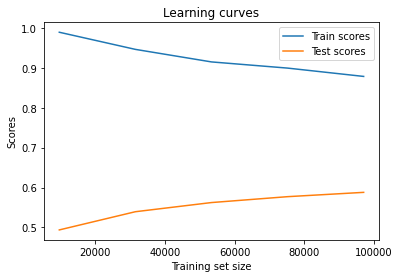

In [112]:
plt.plot(train_size,np.mean((train_scores), axis = 1), label = 'Train scores')
plt.xlabel('Training set size')
plt.ylabel('Scores')
plt.title('Learning curves')
plt.plot(train_size,np.mean((test_scores), axis = 1), label = 'Test scores')
plt.legend()

Even though there is still a bit of data leakage due to the common preprocessing of the cross validation sets, we can notice a high overfitting of our model.
Let's tweak a bit the max_depth and regularizations parameters of our XGBoost model to get marginally better results on our test set.

In [78]:
xgb = XGBRegressor(learning_rate=0.1, max_depth=50, n_estimators=100, reg_alpha=5)

xgb.fit(X_train_transf, y_train)
preds = xgb.predict(X_test_transf)
print('Score on X_test: ',neg_rmse(y_test,preds))

[17:04:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Score on X_test:  -0.49682242168238583


# Conclusion ⭐️

Let's look at our XGBoost model predictions and convert them back from log to actual prices. Then let's compare them to our true prices and compute the average relative error %.

In [95]:
abs_rel_error_list = []

for i, j in zip(np.exp(preds), np.exp(y_test)):
  abs_rel_error_list.append(np.abs(i - j)/j)

np.mean(abs_rel_error_list)

0.385818115865204

We get **an average relative error of around 38%** of the true prices what is significant.

**Comparison to baseline**

Well that result is not that convincing, but where does it stand compared to a baseline model whose very basic approach would be to predict the average price of the train set?

In [43]:
baseline_price = np.exp(np.mean(y_train))
baseline_price

69.80049913834064

In [57]:
abs_rel_error_list_baseline = []

for i, j in zip(
[baseline_price]*len(y_test), np.exp(y_test)):
    abs_rel_error_list_baseline.append(np.abs(i - j)/j)

np.mean(abs_rel_error_list_baseline)

0.7682535288295272

**Our baseline approach average relative error is twice bigger at 76%!**

Overall, several things can explain such an average result from our best model:


1.   The first one I am thinking of is the **lack of granularity when it comes to the city**. Typically, one of the listings for which the model's prediction is the furthest from the true price is a listing whose location is in a remote suburb of Bangkok. It is the only listing located there. Mixing it with all of the Bangkok listings lowers our model's precision. A listing being in New York would not be priced the same way whether it is in Manhattan or in the Bronx. The feature *neighbourhood* could have helped us but it had over 660 unique values.
2.   Another useful element would have been to **further analyze the *amenities* feature**. Currently we are counting the number of different amenities in the listing, and we are not making any difference between a 'Shampoo', a 'Pool' or a 'Long term stays allowed'. Here again the high cardinality of amenities prevents us from a deeper analysis. But clearly it is something to consider.
2.   With higher computational resources, we could have **kept gridsearching better hyperparameters** to get better results.
4.   We could consider **changing some assumptions** (e.g. not assuming the host lives in the same city as its listing when its *host_location* field is not properly filled, using a more granular exchange rate when converting to Euros rather than an average over a 10-year period)
1.   Finally we **lack of information about the target**. What does the price correspond to? Is it a yearly average? Is it the last price observed? Is it the highest one of the last twelve months? Here again, a price during the holidays (e.g. during the summer) would not be the same as one during the low season.
6. Last but far from being the least, **this is a pricing recommendation algorithm: it does not have to exactly match human, hence sometimes biased, prices!** It can happen that our model's prices are more in line with what the market expects than what the hosts priced.









